In [1]:
import shap
import pickle
import pandas as pd
from sklearn.preprocessing import StandardScaler
from classification_utils import *

/Users/lucamoroni/Desktop/__WorkSpace/__Universita/unipi/DataMining/Data_Mining_22_23/venv/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
data = pd.read_csv("dataset/cleaned_user_profiles.csv", index_col=0)

In [3]:
data.head()

,name,lang,bot,created_at,statuses_count,avg_length,avg_special_chars,urls_ratio,mentions_ratio,hashtags_ratio,reply_count_mean,reply_count_std,favorite_count_mean,favorite_count_std,favorite_count_entropy,retweet_count_mean,retweet_count_std
2353593986,Lamonica Raborn,en,1,2019-02-22 18:00:42,76,62.340909,14.015152,0.000000,0.272727,0.098485,0.0,0.0,0.037879,0.190903,0.232481,0.037879,0.190903
2358850842,Lourie Botton,en,0,2019-02-26 03:02:32,54,69.082645,15.041322,0.000000,0.338843,0.024793,0.0,0.0,0.049587,0.217090,0.284639,0.024793,0.155495
137959629,Dadan Syarifudin,en,1,2015-04-30 07:09:56,53,65.340909,14.694444,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000
466124818,Carletto Focia,it,1,2017-01-18 02:49:18,50,86.944871,18.689463,0.022331,0.006281,0.072575,0.0,0.0,0.165387,0.530838,0.669155,0.826239,13.034008
2571493866,MBK Ebook,en,0,2019-06-18 19:30:21,7085,72.311246,14.582073,0.000825,0.506461,0.118229,0.0,0.0,0.056365,0.243387,0.317182,0.016772,0.142619


In [4]:
train_set, test_set, train_label, test_label = prepare_data(data)

Classification features : ['created_at', 'statuses_count', 'avg_length', 'avg_special_chars', 'urls_ratio', 'mentions_ratio', 'hashtags_ratio', 'reply_count_mean', 'reply_count_std', 'favorite_count_mean', 'favorite_count_std', 'favorite_count_entropy', 'retweet_count_mean', 'retweet_count_std']


In [5]:
features = test_set.columns.to_list()

In [6]:
with open("models_checkpoints/decision_tree_no_lang.bin", "rb") as f:
    dt_model = pickle.load(f)

## Explain Model: SHAP

In [9]:
shap_values_tree = shap.TreeExplainer(dt_model).shap_values(test_set.iloc[0:200])

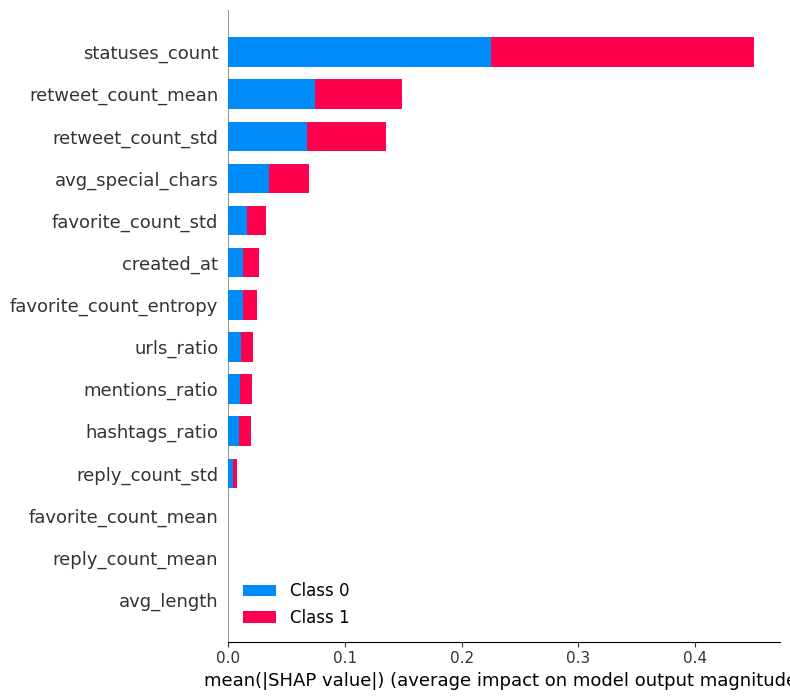

In [10]:
shap.summary_plot(shap_values_tree, test_set.iloc[0:200])

In [11]:
shap_values_tree[0].shape

(200, 14)

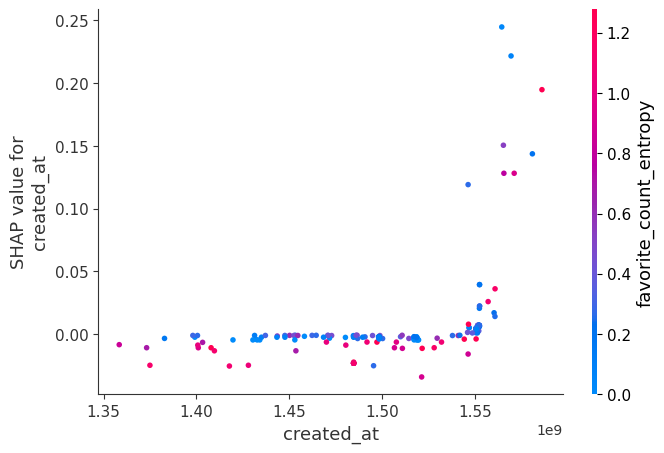

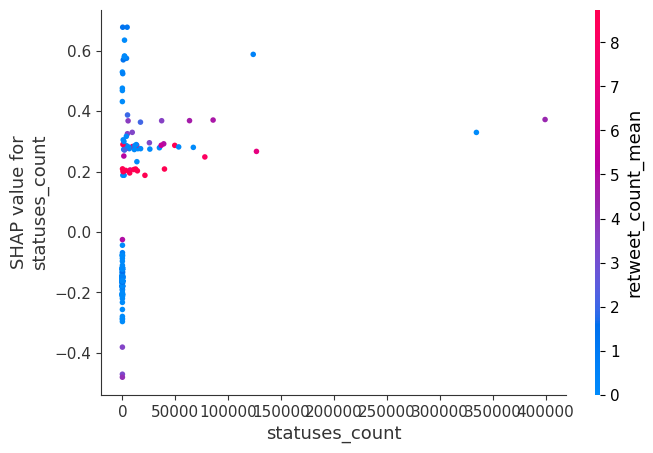

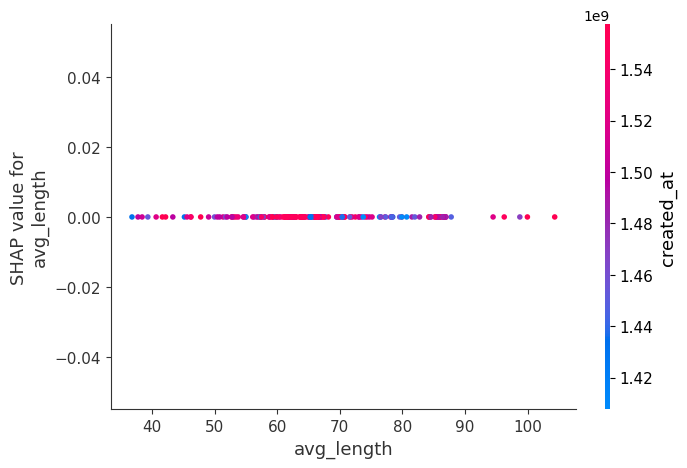

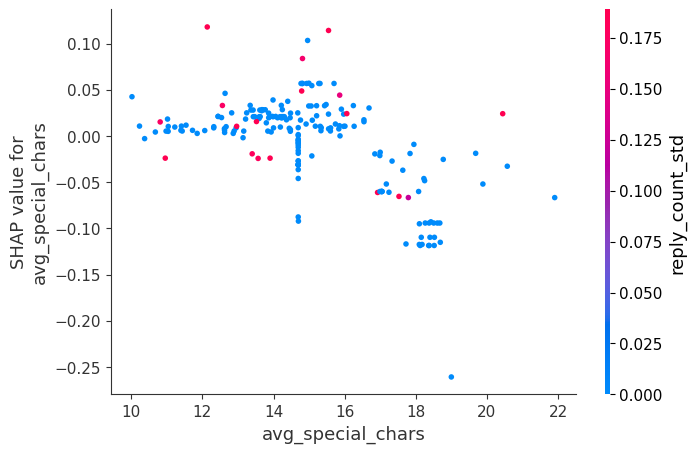

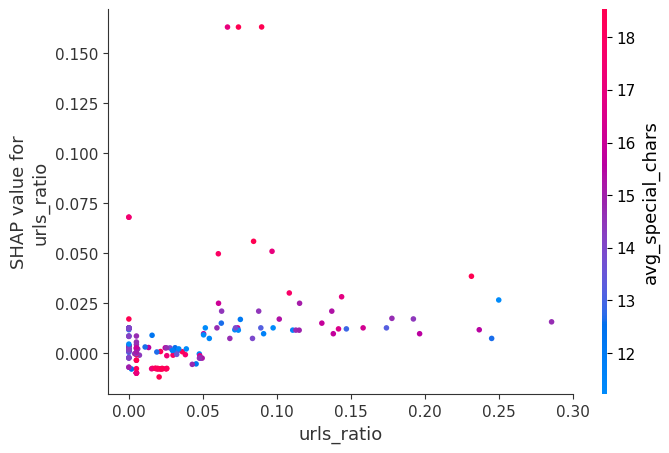

...

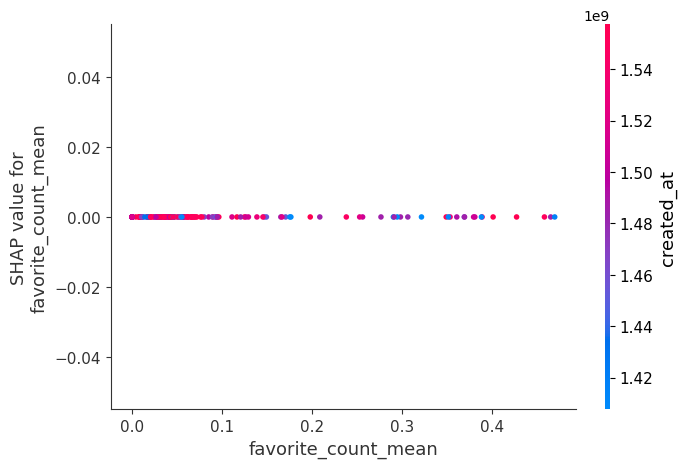

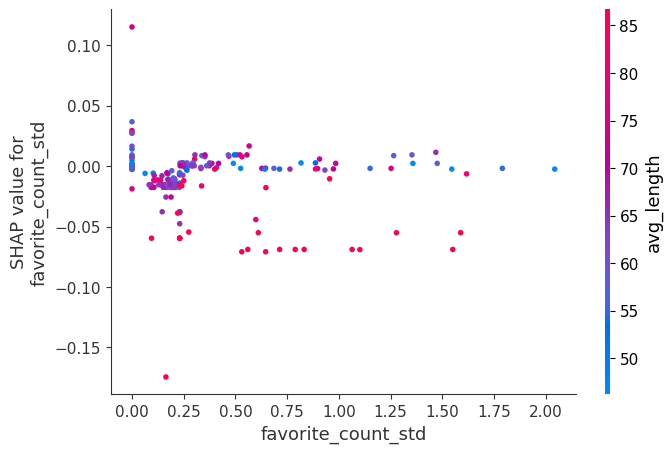

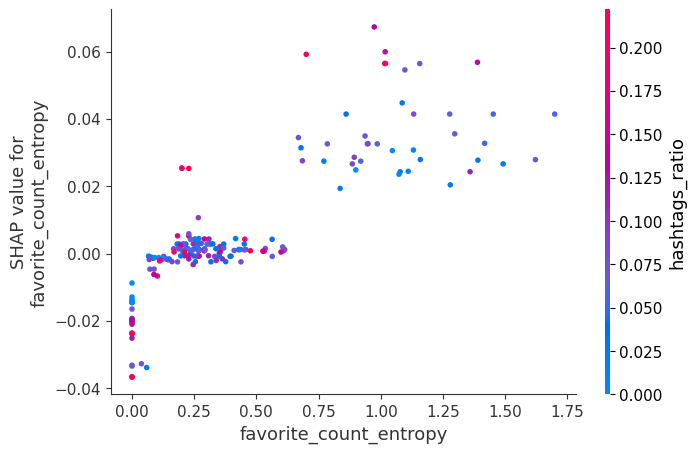

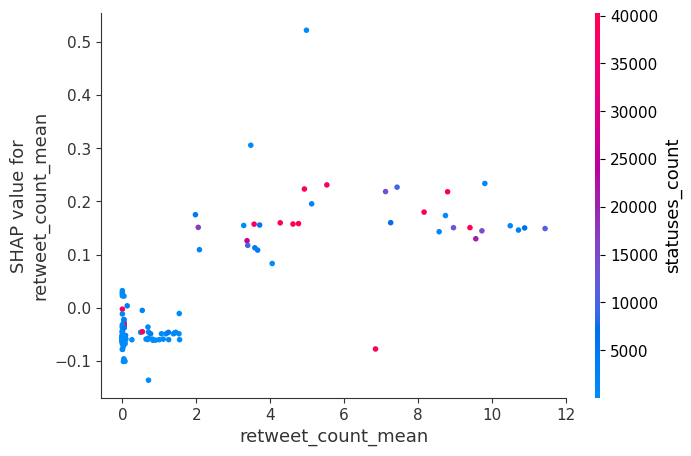

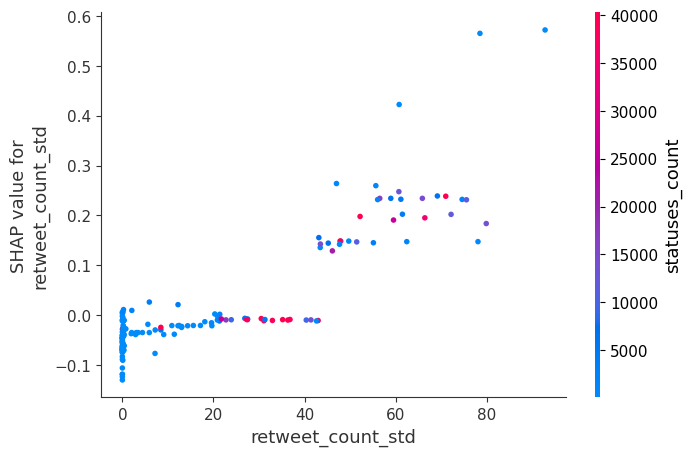

In [12]:
for feat in features:
    shap.dependence_plot(feat, shap_values_tree[0], test_set.iloc[0:200])

In [33]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[0], shap_values_tree[0], test_set.iloc[0:200])

In [55]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[1], shap_values_tree[1], test_set.iloc[0:200])

In [27]:
shap_interaction_values_tree = shap.TreeExplainer(dt_model).shap_interaction_values(test_set.iloc[0:200])

In [28]:
len(shap_interaction_values_tree)

2

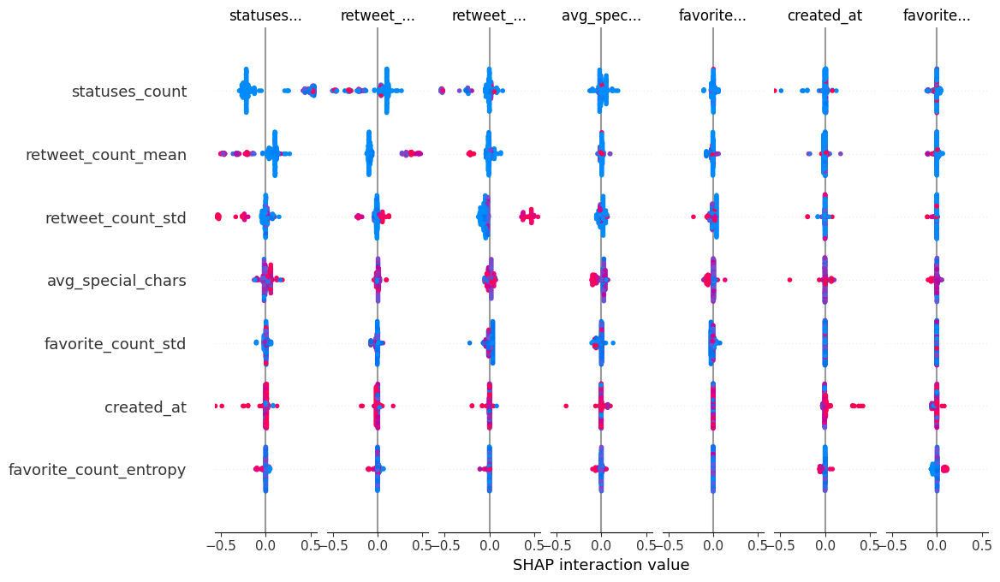

In [30]:
shap.summary_plot(shap_interaction_values_tree[0], test_set.iloc[0:200])

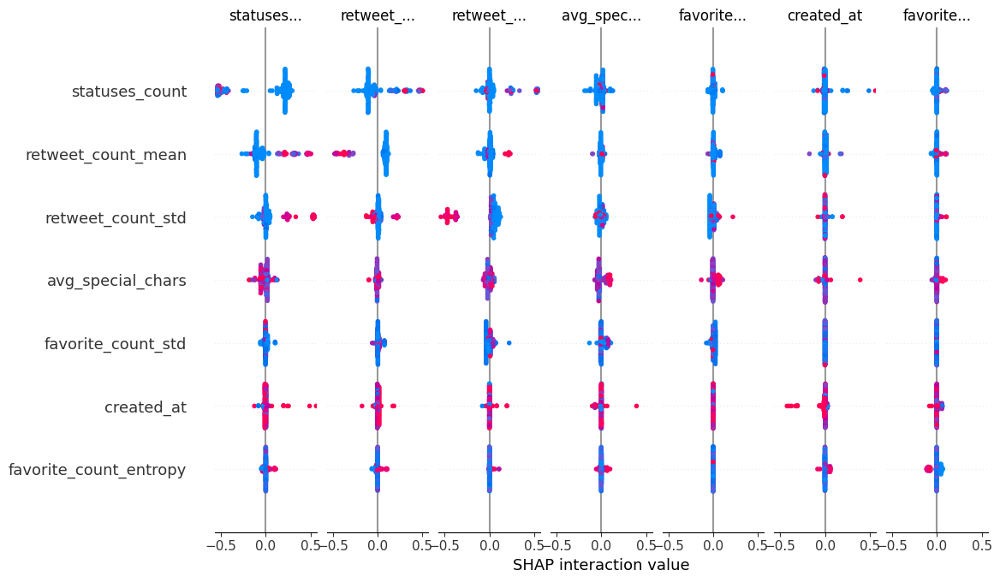

In [29]:
shap.summary_plot(shap_interaction_values_tree[1], test_set.iloc[0:200])

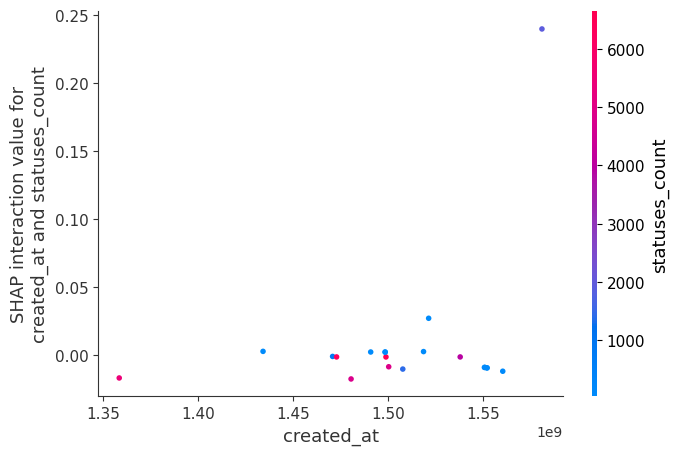

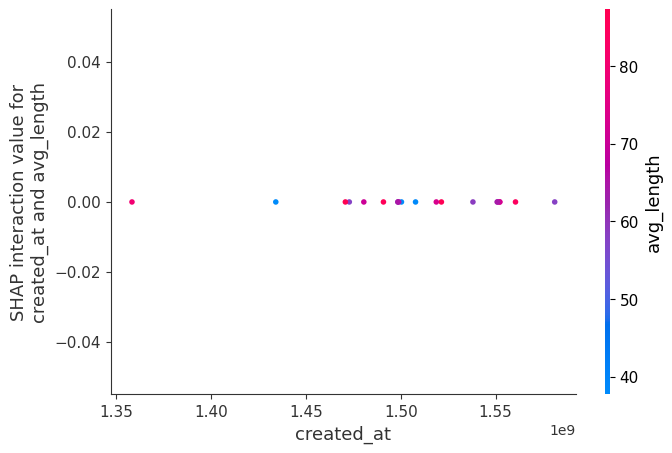

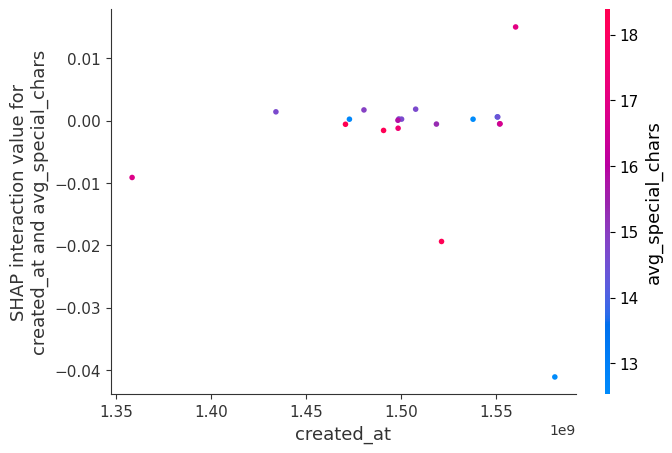

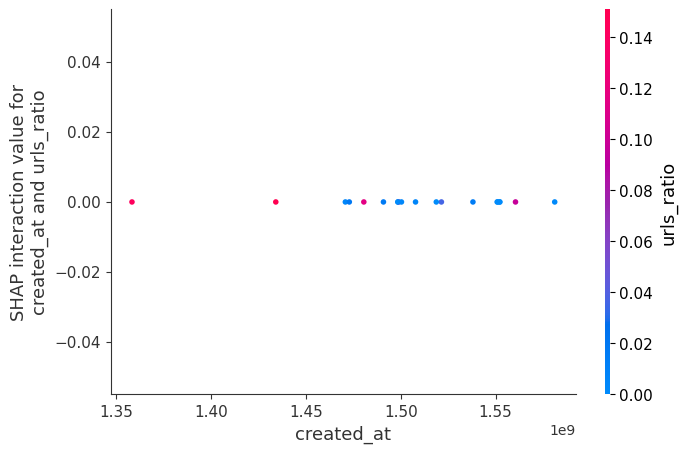

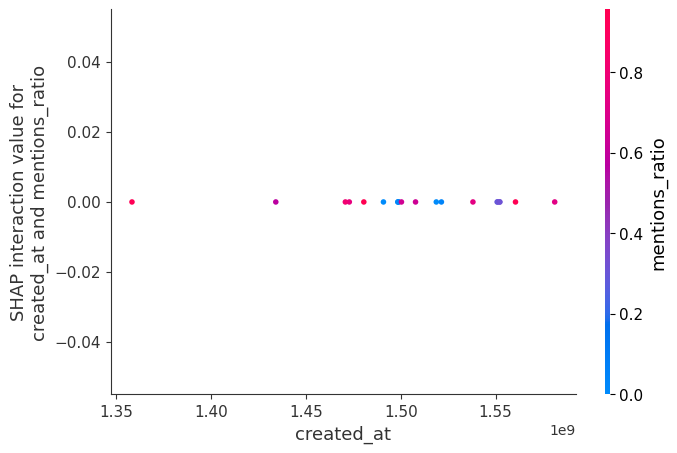

...

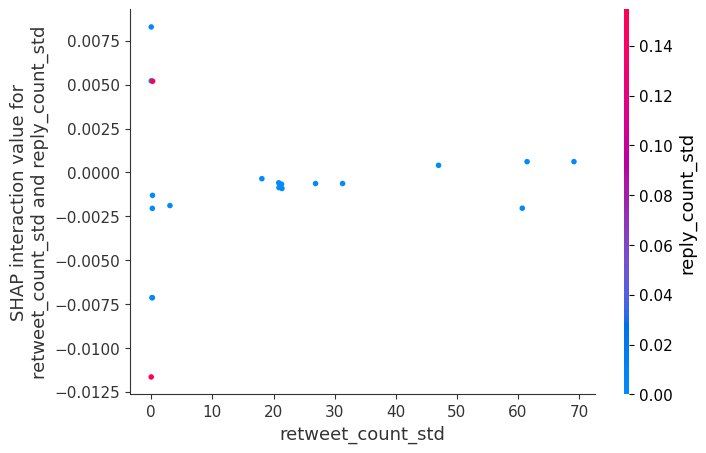

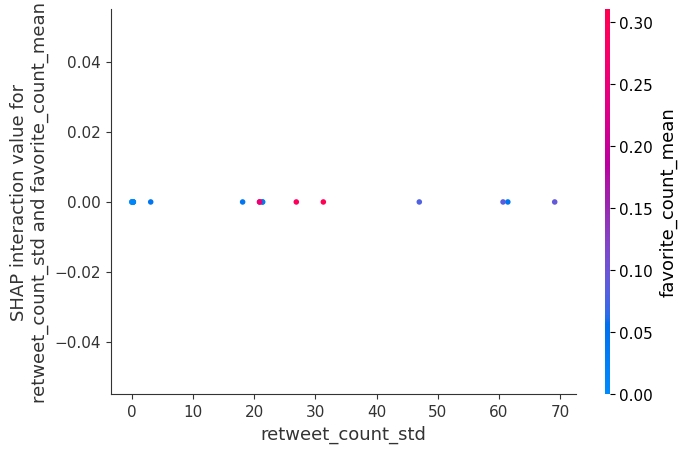

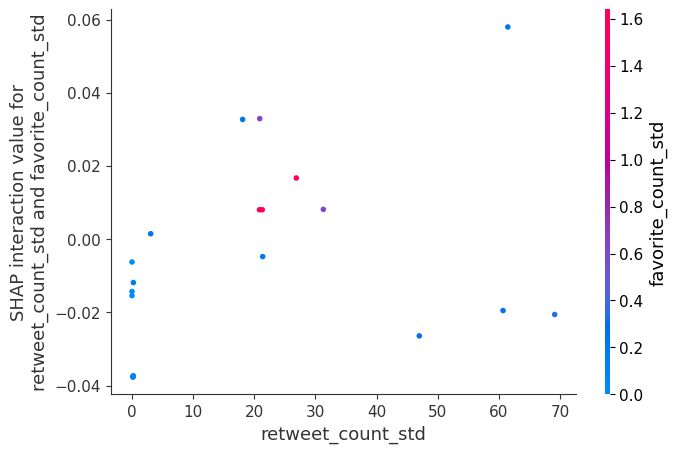

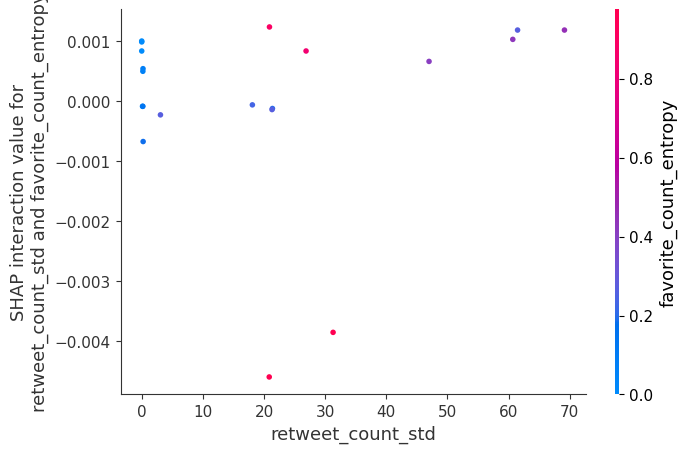

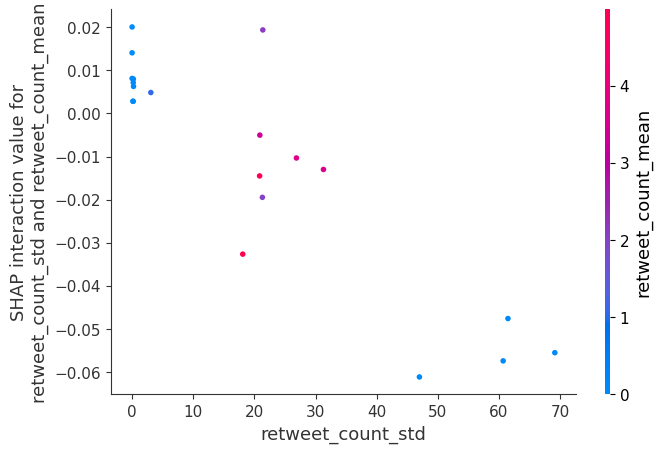

In [26]:
for feat1 in features:
    for feat2 in features:
        if feat1 != feat2:
            shap.dependence_plot(
                (feat1, feat2),
                shap_interaction_values_tree[0], test_set.iloc[0:200]
            )

### Local Explanation

In [34]:
test_set.iloc[0]

created_at                1.507774e+09
statuses_count            1.409000e+03
avg_length                3.842506e+01
avg_special_chars         1.469444e+01
urls_ratio                5.965697e-03
mentions_ratio            6.413125e-01
hashtags_ratio            1.304996e-01
reply_count_mean          0.000000e+00
reply_count_std           0.000000e+00
favorite_count_mean       3.795675e-01
favorite_count_std        2.043852e+00
favorite_count_entropy    9.739306e-01
retweet_count_mean        5.119314e+00
retweet_count_std         2.085572e+01
Name: 870952818, dtype: float64

In [50]:
test_label.iloc[0]

0

In [39]:
dt_model.predict(test_set.values[0].reshape(1, -1))

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


array([0])

In [40]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[0], shap_values_tree[0][0,:], features)

In [46]:
test_set.iloc[2]

created_at                1.434135e+09
statuses_count            5.300000e+01
avg_length                3.680952e+01
avg_special_chars         1.469444e+01
urls_ratio                2.857143e-01
mentions_ratio            5.714286e-01
hashtags_ratio            0.000000e+00
reply_count_mean          0.000000e+00
reply_count_std           0.000000e+00
favorite_count_mean       0.000000e+00
favorite_count_std        0.000000e+00
favorite_count_entropy    0.000000e+00
retweet_count_mean        0.000000e+00
retweet_count_std         0.000000e+00
Name: 154237500, dtype: float64

In [49]:
test_label.iloc[2]

1

In [45]:
dt_model.predict(test_set.values[2].reshape(1, -1))

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


array([1])

In [51]:
shap.force_plot(shap.TreeExplainer(dt_model).expected_value[1], shap_values_tree[1][2,:], features)